# SwinIR 

SwinIR achieves state-of-the-art performance on six tasks: image super-resolution (including classical, lightweight and real-world image super-resolution), image denoising (including grayscale and color image denoising) and JPEG compression artifact reduction.

## Purpose for us: 
We are using SwinIR primarily to upscale images for our solar panel object detection. You can find the complete dataset for it at https://www.kaggle.com/datasets/mmuizfarhan/swinir-lahore
We have also updated and increased our initial dataset. For training results, see the other file 

# 1. Cloning the SwinIR Repo

In [22]:
!wget https://github.com/JingyunLiang/SwinIR/archive/refs/heads/main.zip
# !git clone https://github.com/JingyunLiang/SwinIR.git
!pip install timm

!wget https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth -P experiments/pretrained_models
!wget https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth -P experiments/pretrained_models

--2025-04-30 17:34:02--  https://github.com/JingyunLiang/SwinIR/archive/refs/heads/main.zip
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/JingyunLiang/SwinIR/zip/refs/heads/main [following]
--2025-04-30 17:34:02--  https://codeload.github.com/JingyunLiang/SwinIR/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 140.82.116.10
Connecting to codeload.github.com (codeload.github.com)|140.82.116.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘main.zip.2’

main.zip.2              [       <=>          ]  29.91M  22.5MB/s    in 1.3s    

2025-04-30 17:34:03 (22.5 MB/s) - ‘main.zip.2’ saved [31361028]

--2025-04-30 17:34:07--  https://github.com/JingyunLiang/SwinIR/releases/download/v0.0/003_realSR_BSRGAN_DFO_s64w8_SwinIR-M_x4_GAN.pth
Resolv

In [ ]:
!unzip -q main.zip -d .

In [ ]:
!wget https://github.com/JingyunLiang/SwinIR/blob/6545850fbf8df298df73d81f3e8cba638787c8bd/main_test_swinir.py

# 2. Upload Images

Upload the images to be processed by SwinIR

In [ ]:
import os
import shutil

SOURCE_DIR = "/kaggle/input/satellite-imagery-lahore-dha-phase-6/images"
DEST_DIR = "/kaggle/working/SwinIR-main/testsets/samples"

os.makedirs(DEST_DIR, exist_ok=True)

for i in range(50):  
    img_index = 1 + i * 4
    img_name = f"exported_grid_{img_index}.png"
    src_path = os.path.join(SOURCE_DIR, img_name)
    dest_path = os.path.join(DEST_DIR, img_name)

    if os.path.exists(src_path):
        shutil.copy(src_path, dest_path)


<h3>Resizing Images to reduce size</h3>

mkdir: cannot create directory ‘/kaggle/working/SwinIR-main/testsets/samples_resized’: File exists
exported_grid_85.png: Original size = (2952, 2952), New size = (512, 512)


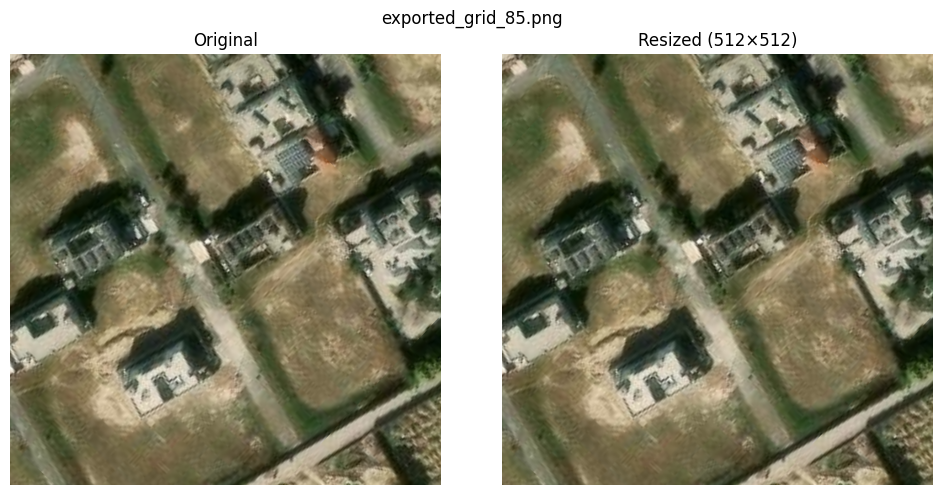

exported_grid_193.png: Original size = (1476, 1476), New size = (512, 512)


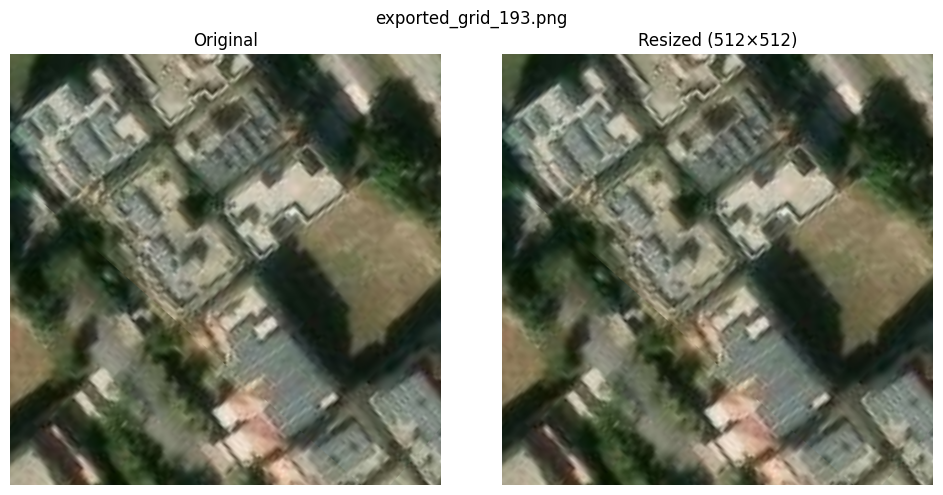

exported_grid_121.png: Original size = (1476, 1476), New size = (512, 512)


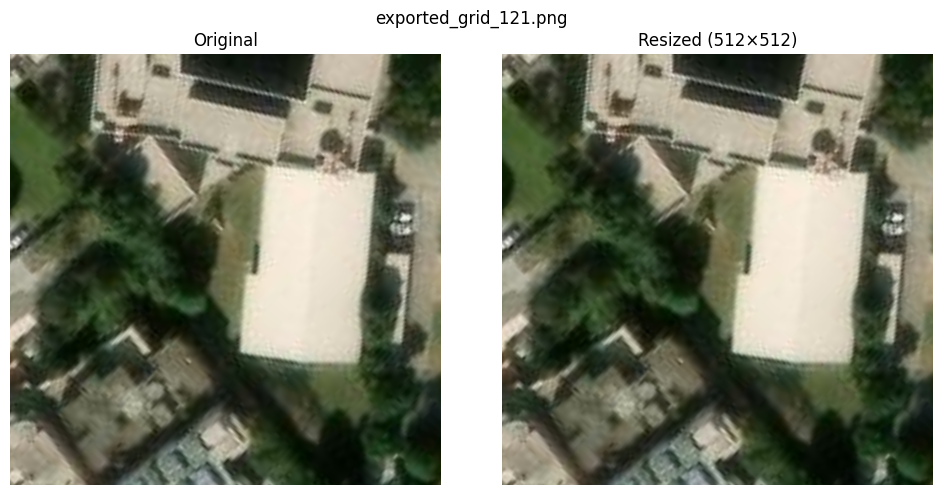

exported_grid_101.png: Original size = (1476, 1476), New size = (512, 512)


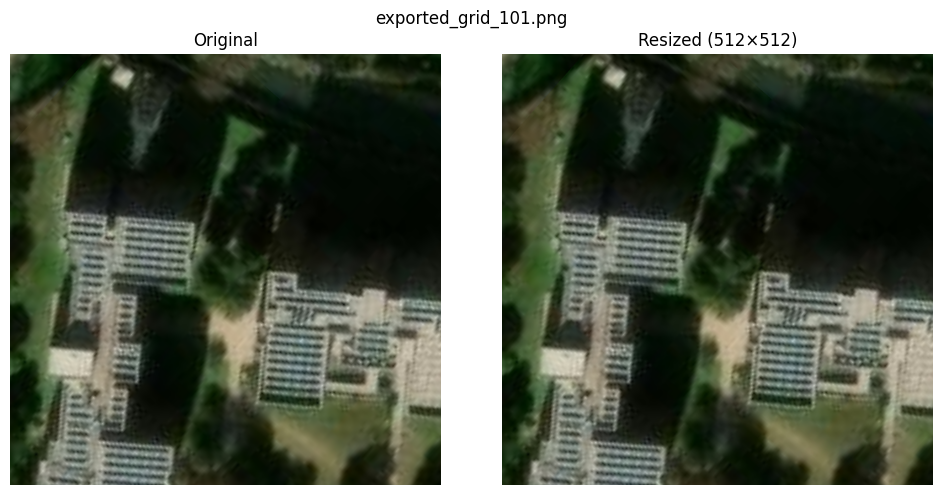

exported_grid_57.png: Original size = (2952, 2952), New size = (512, 512)


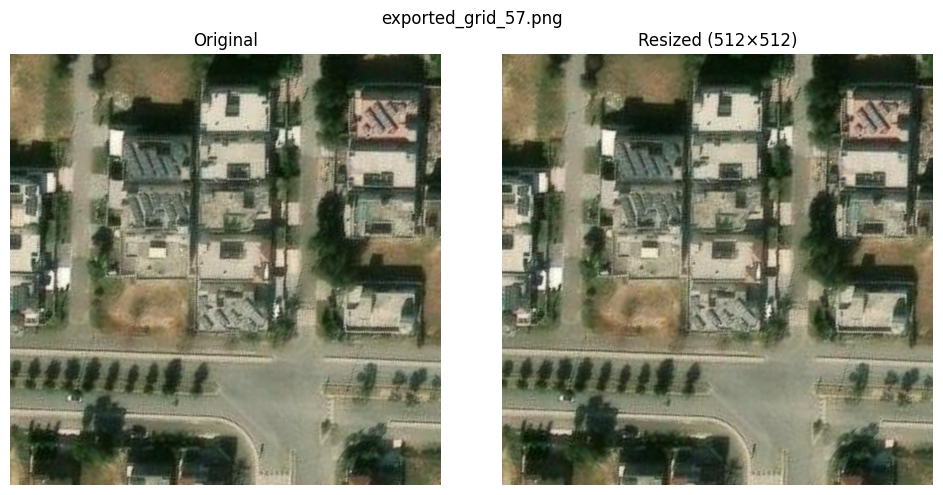

exported_grid_129.png: Original size = (1476, 1476), New size = (512, 512)


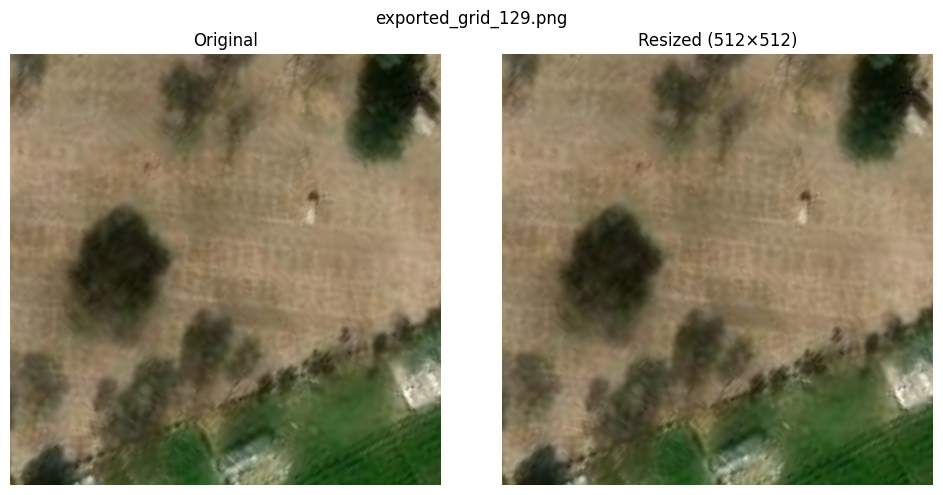

exported_grid_93.png: Original size = (2952, 2952), New size = (512, 512)


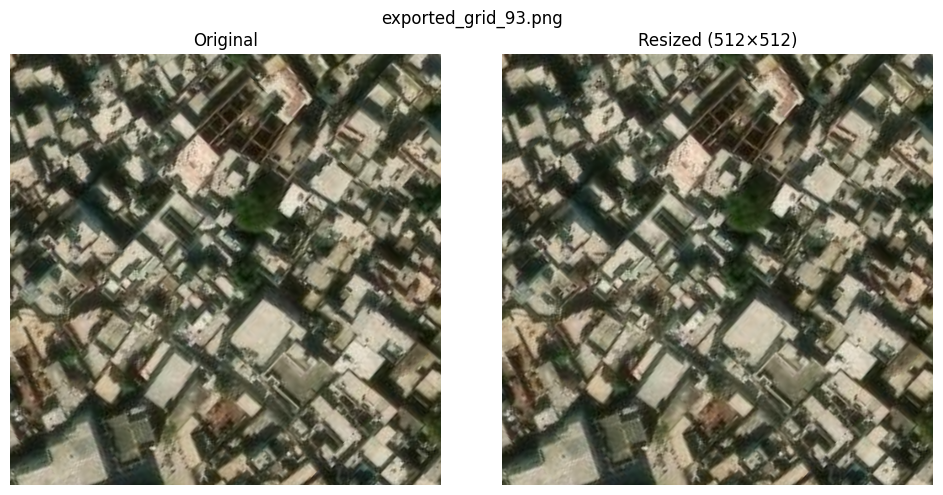

exported_grid_161.png: Original size = (1476, 1476), New size = (512, 512)


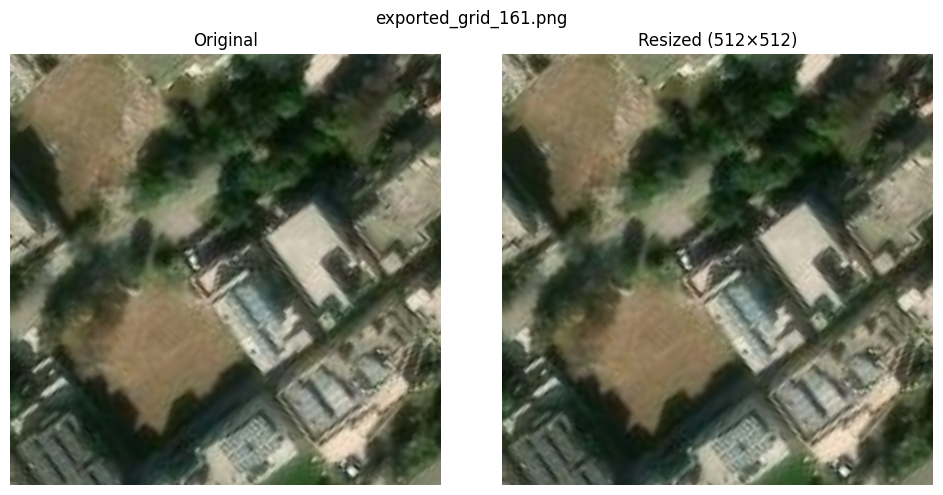

exported_grid_41.png: Original size = (2952, 2952), New size = (512, 512)


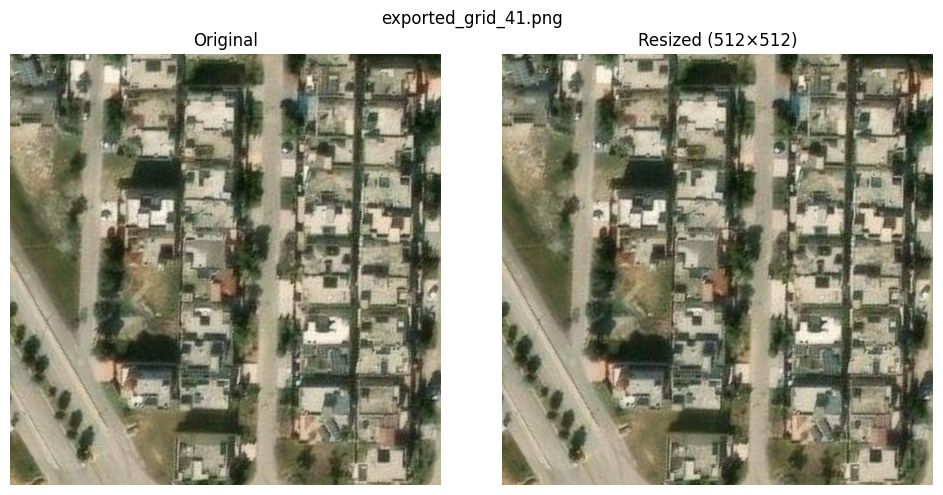

exported_grid_157.png: Original size = (1476, 1476), New size = (512, 512)


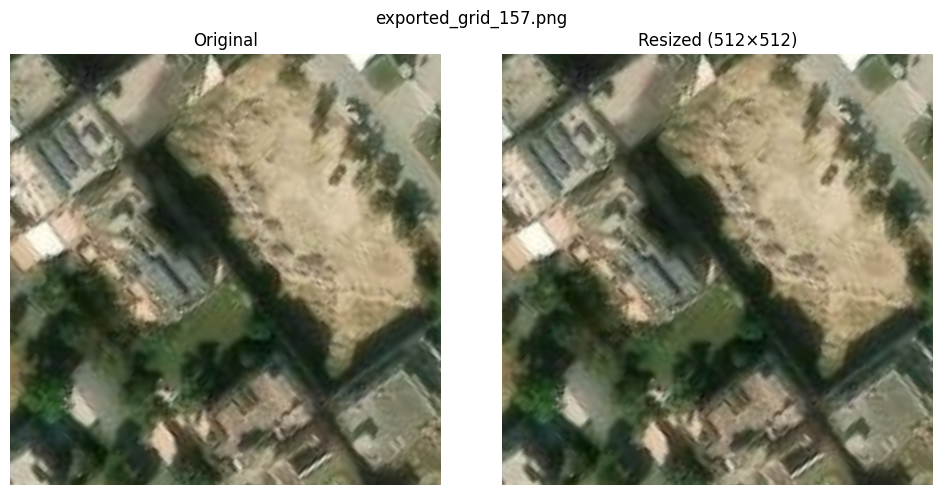

In [23]:
import os
from PIL import Image
import matplotlib.pyplot as plt

img_dir = "/kaggle/working/SwinIR-main/testsets/samples"
output_dir = "/kaggle/working/SwinIR-main/testsets/samples_resized"

!mkdir /kaggle/working/SwinIR-main/testsets/samples_resized

for i, fname in enumerate(os.listdir(img_dir)):
    if fname.lower().endswith(".png"):
        img_path = os.path.join(img_dir, fname)
        output_path = os.path.join(output_dir, fname)
        original_img = Image.open(img_path)
        original_size = original_img.size

        resized_img = original_img.resize((512, 512), Image.LANCZOS)
        resized_img.save(output_path)

        if i < 10:
            print(f"{fname}: Original size = {original_size}, New size = {resized_img.size}")
    
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            axes[0].imshow(original_img)
            axes[0].set_title("Original")
            axes[0].axis("off")
            
            axes[1].imshow(resized_img)
            axes[1].set_title("Resized (512×512)")
            axes[1].axis("off")
            
            plt.suptitle(fname)
            plt.tight_layout()
            plt.show()


# 3. Inference


In [ ]:
import os
import shutil
import glob

result_folder = '/kaggle/working/SwinIR-main/results'
if os.path.isdir(result_folder):
    shutil.rmtree(result_folder)
os.mkdir(result_folder)

!python /kaggle/working/SwinIR-main/main_test_swinir.py --task real_sr --model_path /kaggle/working/experiments/pretrained_models/003_realSR_BSRGAN_DFOWMFC_s64w8_SwinIR-L_x4_GAN.pth --folder_lq /kaggle/working/SwinIR-main/testsets/samples_resized --scale 4 --large_model


# 4. Visualization

exported_grid_1.png: Original = (512, 512), SwinIR Output = (2048, 2048)


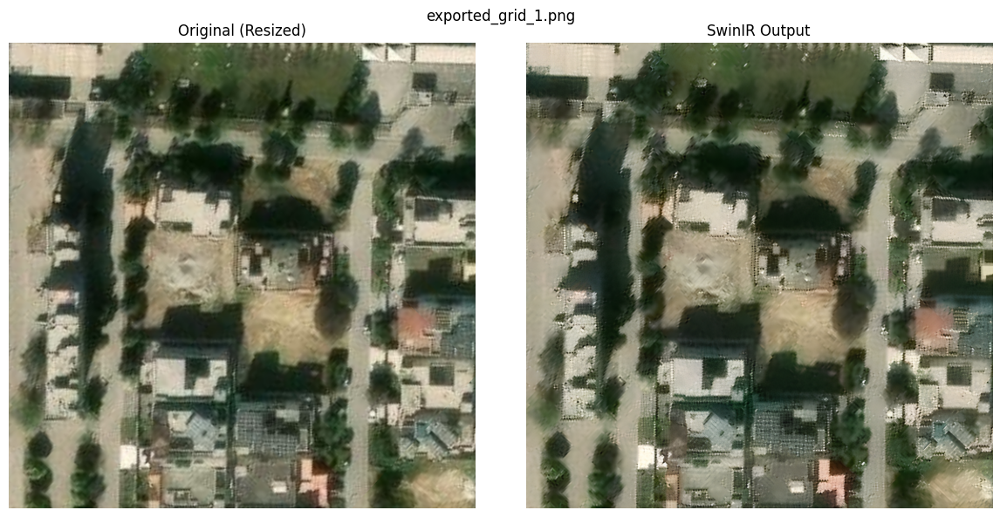

exported_grid_101.png: Original = (512, 512), SwinIR Output = (2048, 2048)


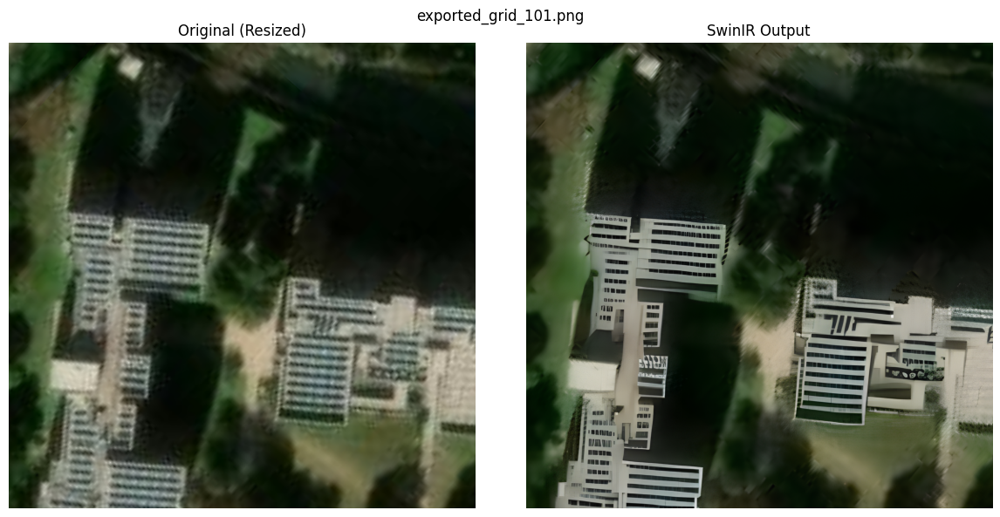

exported_grid_105.png: Original = (512, 512), SwinIR Output = (2048, 2048)


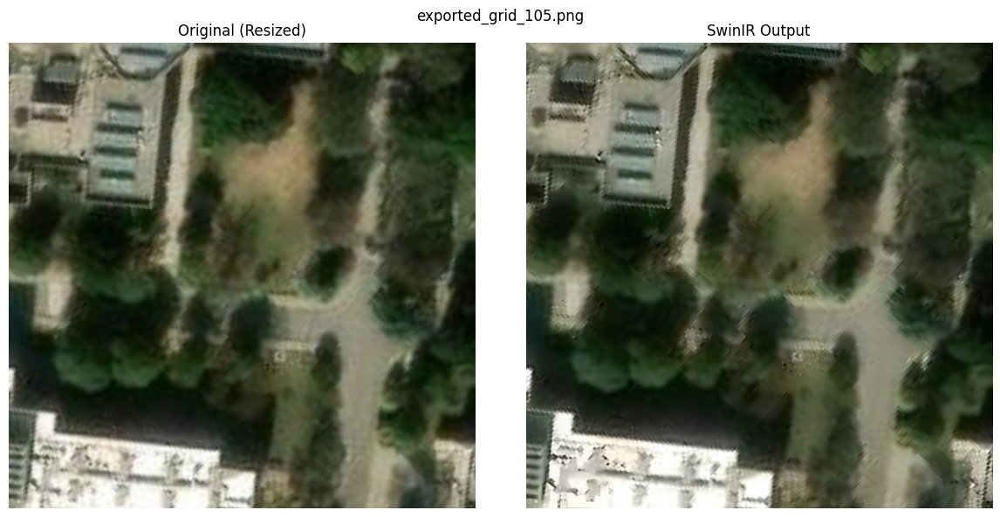

exported_grid_109.png: Original = (512, 512), SwinIR Output = (2048, 2048)


In [30]:
import os
from PIL import Image
import matplotlib.pyplot as plt

resized_dir = "/kaggle/working/SwinIR-main/testsets/samples_resized"
output_dir = "/kaggle/working/results/swinir_real_sr_x4_large"

for i, fname in enumerate(sorted(os.listdir(resized_dir))):
    if fname.lower().endswith(".png"):
        original_path = os.path.join(resized_dir, fname)

        name_only = fname.replace(".png", "")
        swinir_output_name = f"{name_only}_SwinIR.png"
        result_path = os.path.join(output_dir, swinir_output_name)

        if not os.path.exists(result_path):
            print(f"⚠️ SwinIR output not found for: {fname}")
            continue

        original = Image.open(original_path).convert("RGB")
        result = Image.open(result_path).convert("RGB")

        if i<5:
            print(f"{fname}: Original = {original.size}, SwinIR Output = {result.size}")
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            axes[0].imshow(original)
            axes[0].set_title("Original (Resized)")
            axes[0].axis("off")

            axes[1].imshow(result)
            axes[1].set_title("SwinIR Output")
            axes[1].axis("off")

            plt.suptitle(fname)
            plt.tight_layout()
            plt.show()


<h3>Comparing Raw Swin Ouput Image and Resized (512 * 512) Version of it</h3>

exported_grid_101_SwinIR.png: Original = (2048, 2048), Resized = (512, 512)


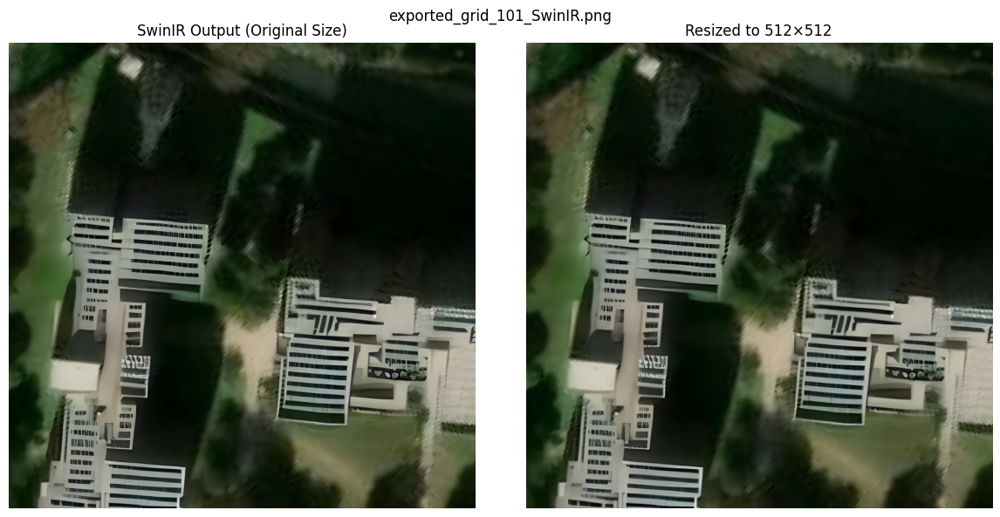

exported_grid_105_SwinIR.png: Original = (2048, 2048), Resized = (512, 512)


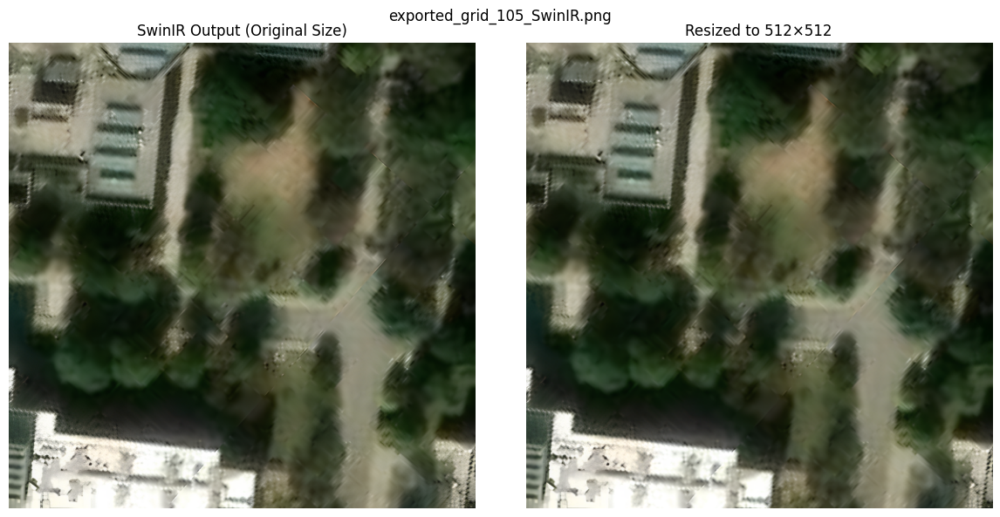

exported_grid_109_SwinIR.png: Original = (2048, 2048), Resized = (512, 512)


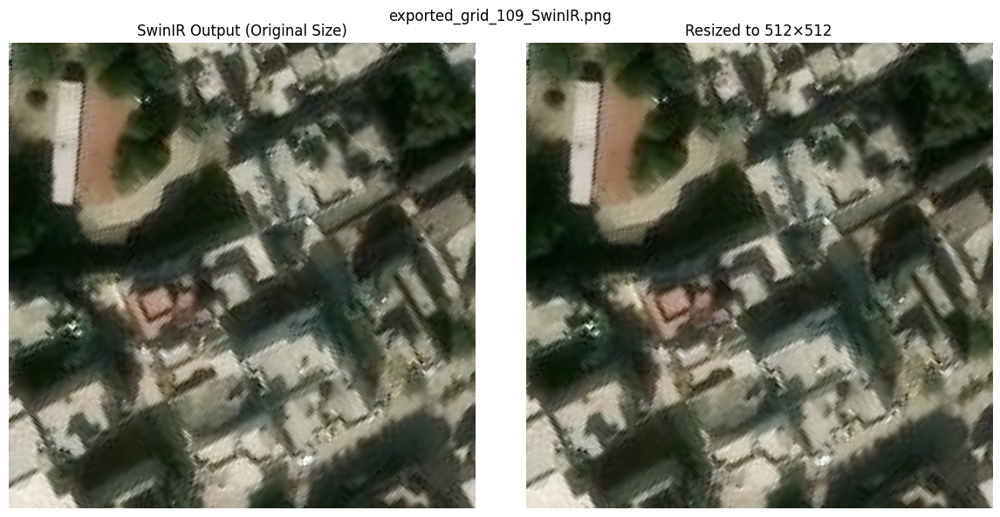

exported_grid_113_SwinIR.png: Original = (2048, 2048), Resized = (512, 512)


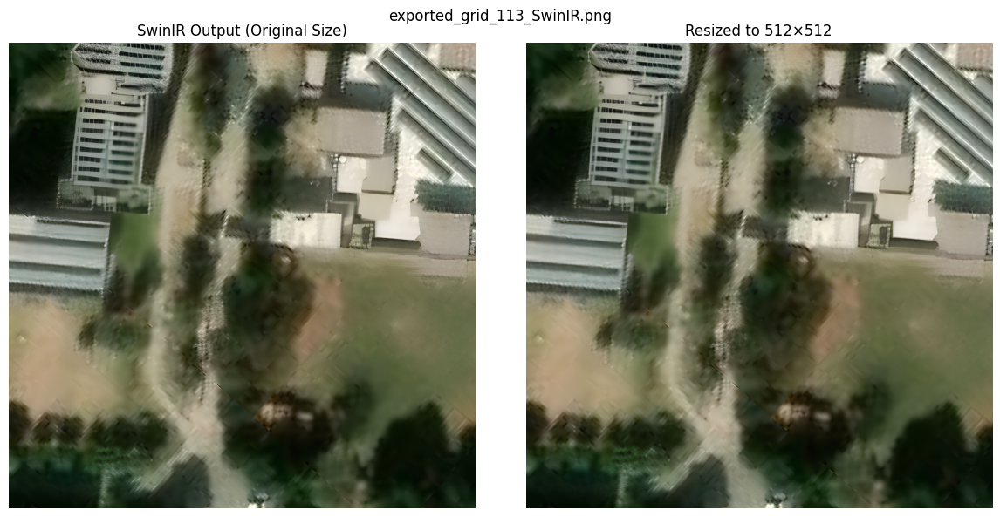

exported_grid_117_SwinIR.png: Original = (2048, 2048), Resized = (512, 512)


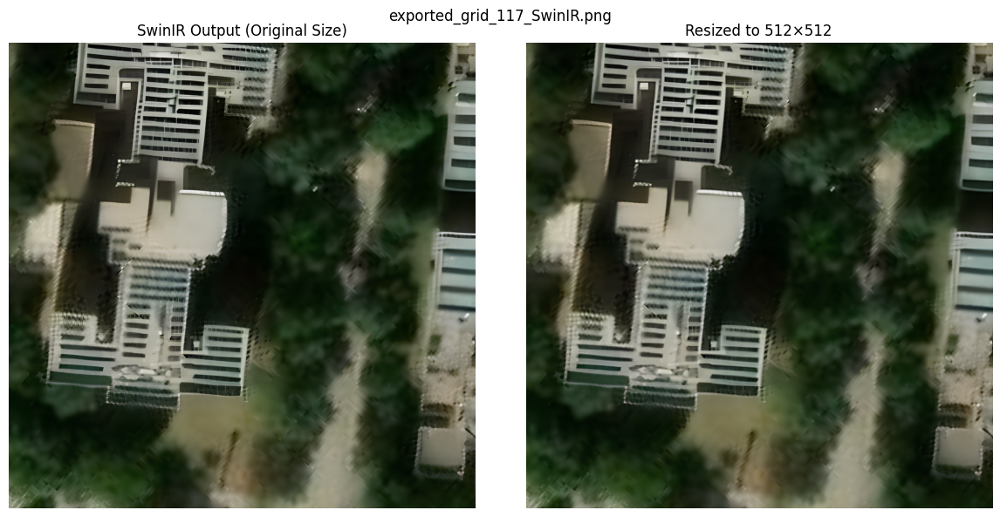

In [31]:
import os
from PIL import Image
import matplotlib.pyplot as plt

input_dir = "/kaggle/working/results/swinir_real_sr_x4_large"
output_dir = "/kaggle/working/results/swinir_real_sr_x4_large_resized"

os.makedirs(output_dir, exist_ok=True)

for i, fname in enumerate(sorted(os.listdir(input_dir))):
    if fname.lower().endswith(".png"):
        input_path = os.path.join(input_dir, fname)
        output_path = os.path.join(output_dir, fname)

        swinir_img = Image.open(input_path).convert("RGB")
        swinir_resized = swinir_img.resize((512, 512), resample=Image.BICUBIC)

        swinir_resized.save(output_path)


        if i < 5:
            print(f"{fname}: Original = {swinir_img.size}, Resized = {swinir_resized.size}")
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            axes[0].imshow(swinir_img)
            axes[0].set_title("SwinIR Output (Original Size)")
            axes[0].axis("off")

            axes[1].imshow(swinir_resized)
            axes[1].set_title("Resized to 512×512")
            axes[1].axis("off")

            plt.suptitle(fname)
            plt.tight_layout()
            plt.show()


In [ ]:
import shutil

zip_path = "/kaggle/working/swinir_outputs.zip"
folder_to_zip = "/kaggle/working/results/swinir_real_sr_x4_large"

shutil.make_archive(base_name=zip_path.replace('.zip', ''), format='zip', root_dir=folder_to_zip)


In [ ]:
import os

folder = "/kaggle/working/results/swinir_real_sr_x4_large"
txt_output_path = "/kaggle/working/swinir_filenames.txt"

with open(txt_output_path, "w") as f:
    for fname in sorted(os.listdir(folder)):
        if fname.endswith(".png") and "_SwinIR" in fname:
            clean_name = fname.replace("_SwinIR.png", "")
            f.write(clean_name + "\n")